# Reduce Jan 14th 2023 data 

* HZ4 red (240s)  and blue  (300s) 
* SDSS005513.15-005621.2  (S82) only red; two exposures : one 1800 s, one 1450 s ... 
 



In [280]:
import sys
sys.path.append('/Users/chris/GradResearch/kosmos/')
#import kosmos
 # need notebook backend for interaction
#%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt

# file-handling stuff for user, options abound! I like Tables and Pandas DataFrames
import pandas as pd
from astropy.table import Table
from astropy import units as u
from astropy.io import fits
import os
# import kosmos... if we do it right this should be the only other thing to import someday!
import sys  
sys.path.append('..')

import kosmos
kosmos.__version__


'0.1'

# 1. Bias combine

1 a ) Add missing kwds...
There are the following keywords:

    CSEC11  = '[1:1024,1:4096]'    / data section of CCD (unbinned)                 
    CSEC12  = '[1025:2048,1:4096]' / data section of CCD (unbinned)                 
    DSEC11  = '[1:1024,1:4096]'    / data section of image (binned)                 
    BSEC11  = '[2049:2098,1:4096]' / bias section of image (binned)                 
    DSEC12  = '[1025:2048,1:4096]' / data section of image (binned)                 
    BSEC12  = '[2099:2148,1:4096]' / bias section of image (binned)  
but not DATASEC ....

Check that GAIN, DATASEC, RDNOISE keywords are missing ... 

['/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0003.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0002.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0005.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0009.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0008.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0004.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0007.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0006.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0001.fits']

In [14]:
kwds_dic = {'GAIN':0.6, 'DATASEC':'[1:2048, 1:4096]' , 'RDNOISE':6}

for file in biasfiles:
    hdul = fits.open(file)
    for kw in kwds_dic.keys():
        if kw in dict(hdul[0].header).keys():
            continue
        else:
            print(f'{kw} is missing ')
            ofile = fits.open(file, mode='update')
            value = kwds_dic[kw]
            ofile[0].header[kw] = value
            print(f'Updated, adding {kw}:{value}')
            ofile.flush()
            ofile.close()

1 b)  Instead of using  `kos_wrap.make_superbias` which calls  `kosmos.biascombine` and makes some plots, use `kosmos.biascombine` and make plots myself: 

In [15]:
bias = kosmos.biascombine(biasfiles)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]


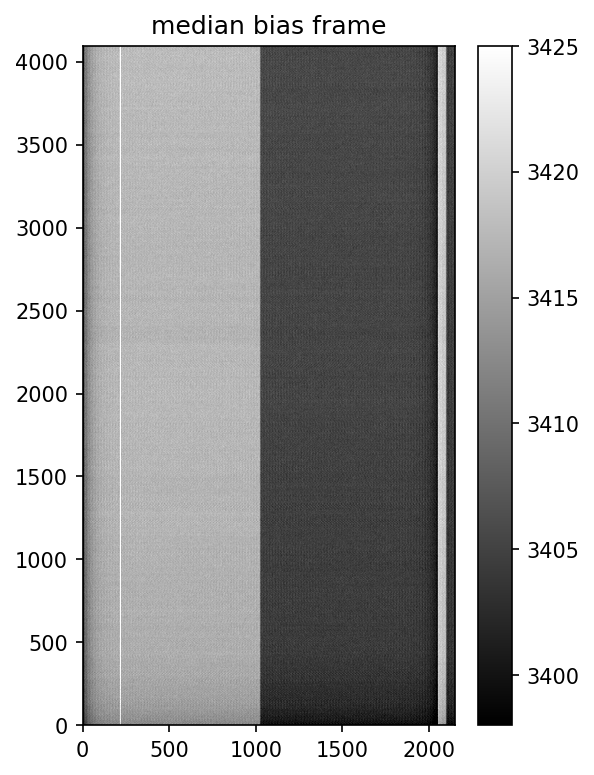

In [710]:
plt.figure(figsize=(4,6), dpi=150, facecolor='w')
plt.imshow(bias, origin='lower', aspect='auto', cmap=plt.cm.gray)
plt.title('median bias frame')
plt.clim(np.percentile(bias, (5, 98)))
cb = plt.colorbar()

# 2. Flat Combine

We've got both internal and external flats. First combine the internal ones:

In [20]:
fnames =  [file for file in files if file.startswith('flatRedQrtzExt')]
flat_red_ext_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('flatRedQrtzInt')]
flat_red_int_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('flatBlueQrtzExt')]
flat_blue_ext_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('flatBlueQrtzInt')]
flat_blue_int_fpaths = [os.path.join(path,fname) for fname in fnames]



Quickly check if one of the flat files has the keywords required  by flatcombine... 

In [51]:
kwds = ['DATASEC','EXPTIME']
for fpath in flat_red_ext_fpaths:
    hdu = fits.open(fpath)
    for kw in kwds:
        if kw in list(hdu[0].header):
            print(kw, hdu[0].header[kw])
        else:
            print(f'{kw} is missing... ')
            
kwds = ['DATASEC','EXPTIME']
for fpath in flat_red_int_fpaths:
    hdu = fits.open(fpath)
    for kw in kwds:
        if kw in list(hdu[0].header):
            print(kw, hdu[0].header[kw])
        else:
            print(f'{kw} is missing... ')

DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 60.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0
DATASEC [1:2048, 1:4096]
EXPTIME 15.0


The 'DATASEC' for interntal vs external flats are identical. Yet after running `flatcombine` I'm getting different sizes... How is that possible? 

In [30]:
flat_red_ext, ilum_red_ext = kosmos.flatcombine(flat_red_ext_fpaths, bias=bias, Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-po

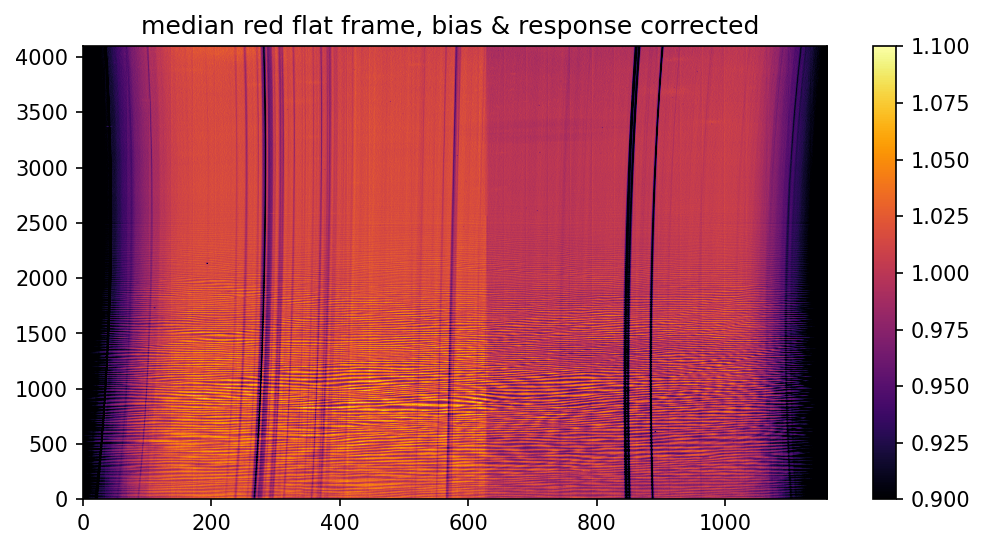

In [34]:
fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150, facecolor='w')
im = ax.imshow(flat_red_ext, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median red flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


Why isn't it very flat? What are all these lines doing there? 

In [35]:
flat_red_int, ilum_red_int = kosmos.flatcombine(flat_red_int_fpaths,bias=bias, Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-po

In [49]:
np.shape(flat_red_int)

(4096, 1228)

In [50]:
np.shape(flat_red_ext)

(4096, 1158)

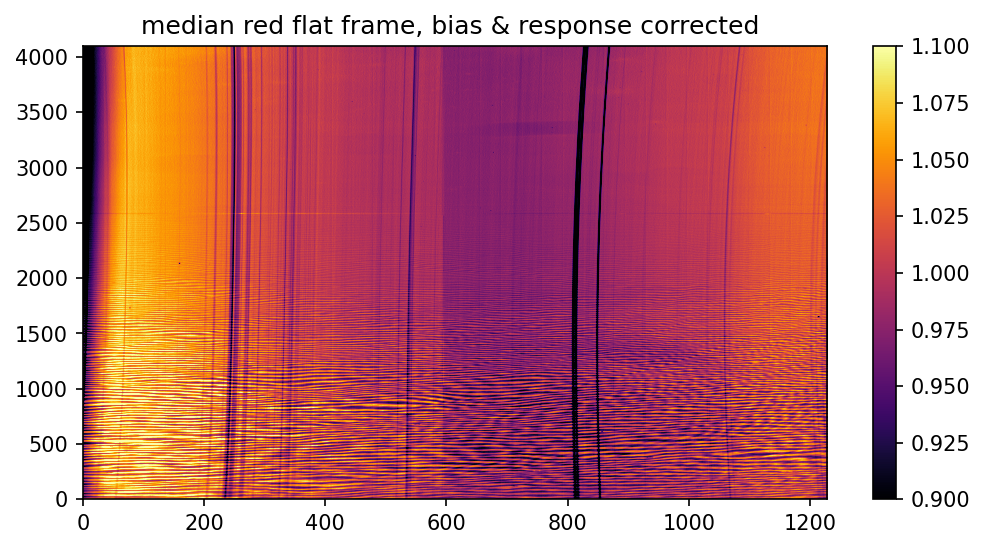

In [38]:
fig, ax = plt.subplots(1,1, figsize=(8, 4),dpi=150, facecolor='w')
im = ax.imshow(flat_red_int, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median red flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


Looks pretty similar.. Am I doing sth wrong? 

In [39]:
flat_blue_ext, ilum_blue_ext = kosmos.flatcombine(flat_blue_ext_fpaths,
                                       bias=bias, Saxis=1)

flat_blue_int, ilum_blue_int = kosmos.flatcombine(flat_blue_int_fpaths,
                                       bias=bias, Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-po

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-po

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


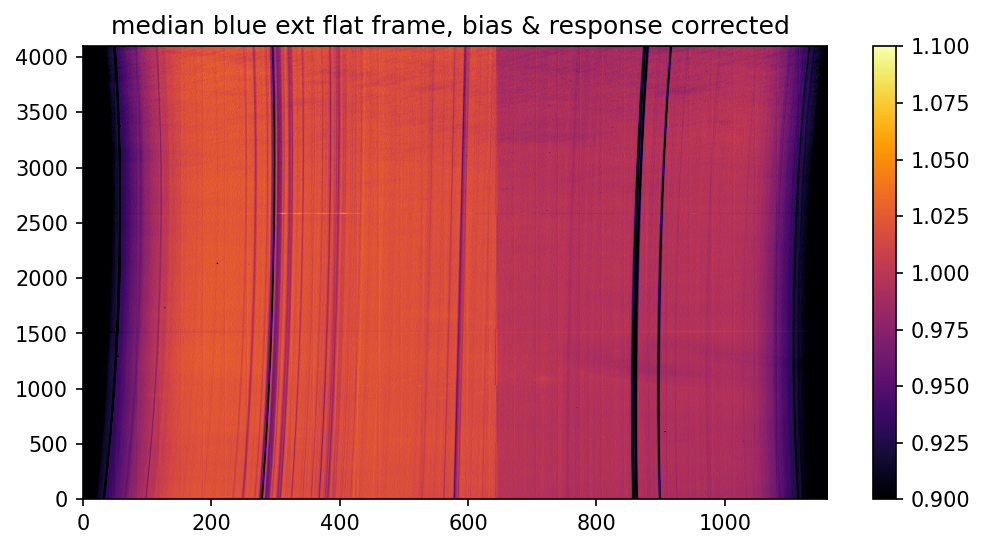

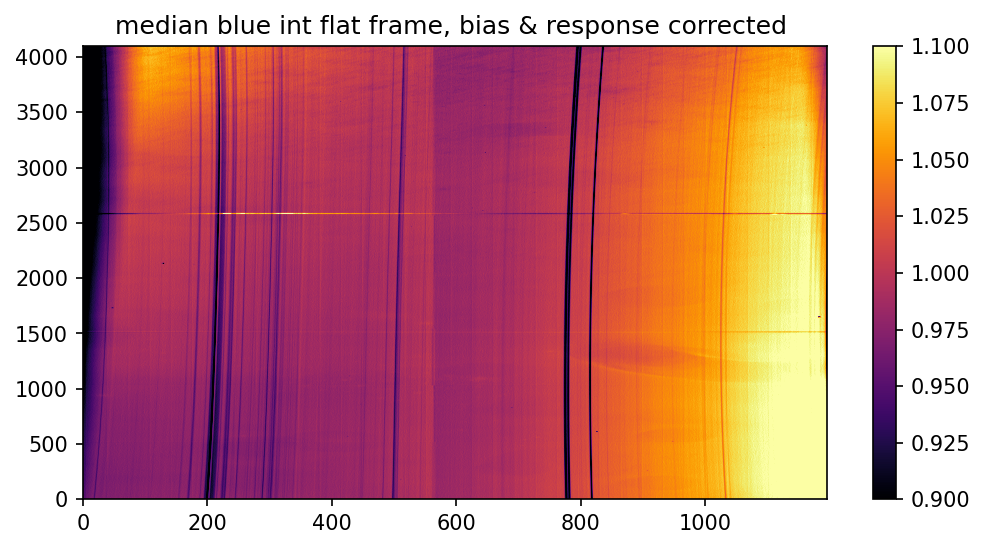

In [40]:
%matplotlib inline
fig, ax = plt.subplots(1,1, figsize=(8, 4),dpi=150, facecolor='w')
im = ax.imshow(flat_blue_ext, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median blue ext flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


fig, ax = plt.subplots(1,1, figsize=(8, 4),dpi=150, facecolor='w')
im = ax.imshow(flat_blue_int, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median blue int flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


Subtract one from another to check the residuals - the levels are pretty similar ... 
Can't subtract b/c shapes don't match .. why ? (4096,1195) (4096,1159)  --> seems that the overscans somehow are different. How is that possible ?

In [53]:
np.shape(flat_blue_int.data)

(4096, 1195)

In [54]:
np.shape(flat_blue_ext.data)

(4096, 1159)

In [55]:
np.shape(flat_red_int.data)#-

(4096, 1228)

In [56]:
np.shape(flat_red_ext.data)

(4096, 1158)

ValueError: operands could not be broadcast together with shapes (4096,1195) (4096,1159) 

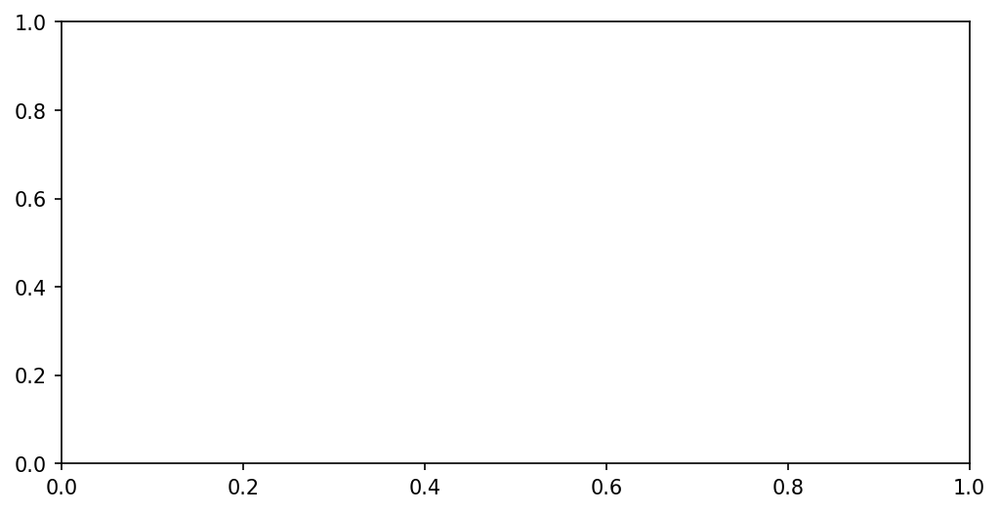

In [44]:
fig, ax = plt.subplots(1,1, figsize=(8, 4),dpi=150, facecolor='w')
im = ax.imshow(flat_blue_int.data-flat_blue_ext.data, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno,)# vmin=0.9, vmax=1.1)
ax.set_title('median blue flat  internal - external (frame, bias & response corrected) ')
plt.colorbar(mappable=im, ax=ax)

# 2D reduction: HZ4 (standard)

In [57]:
fnames =  [file for file in files if file.startswith('HZ4Blue')]
std_blue = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('HZ4Red')]
std_red = [os.path.join(path,fname) for fname in fnames]


Plot the raw spectrum (preview)

In [60]:
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()


In [295]:
hdul = fits.open(std_red[i])
hdul[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2148                                                  
NAXIS2  =                 4096                                                  
EXTEND  =                    T                                                  
OBSERVAT= 'APO'                / Per the IRAF observatory list.                 
TELESCOP= '3.5m'                                                                
INSTRUME= 'kosmos'             / Instrument name                                
LATITUDE= +3.2780361000000E+01 / Latitude of telescope base                     
LONGITUD= -1.0582041700000E+02 / Longitude of telescope base                    
TIMESYS = 'TAI'                / Time system for DATE-OBS                       
UTC-TAI = -37.0             

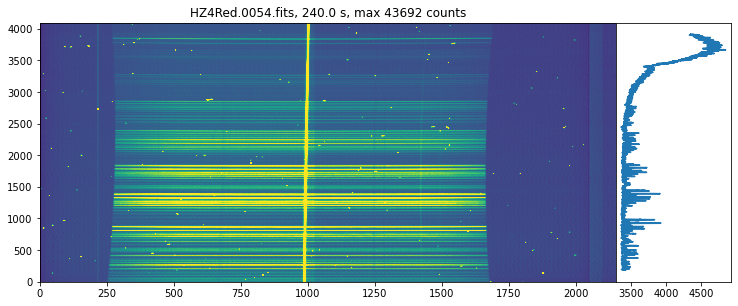

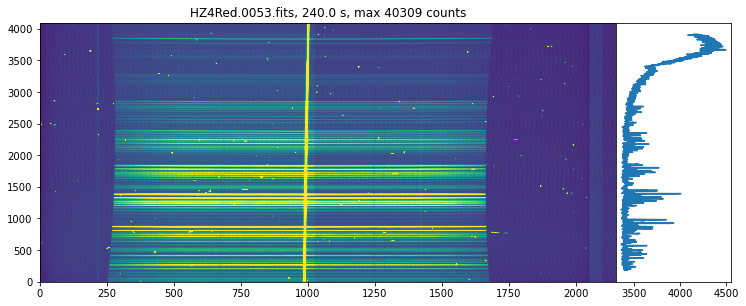

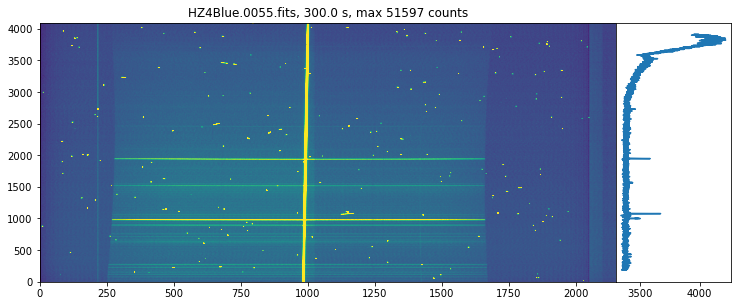

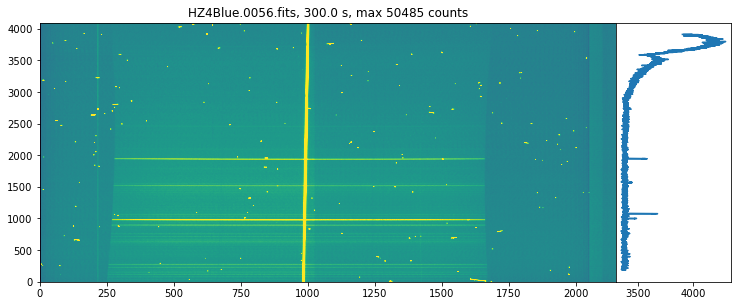

In [61]:
def plot_spec_trace(hdul,fname):
    fig = plt.figure(figsize=(8, 4))
    left, bottom, width, height = 0,0.1,1,0.9
    ax = fig.add_axes([left,bottom,width,height])
    exp = hdul[0].header['EXPTIME']
    data = hdul[0].data
    maxcount = np.max(data)
    ax.set_title(f'{fname}, {exp} s, max {maxcount} counts')
    vmin,vmax = zscale.get_limits(data)
    ax.imshow(data,vmin=vmin, vmax=vmax, origin='lower',aspect='auto')

    # right hand side 
    ax1 = fig.add_axes([1,bottom,0.2,height], yticks=[])# sharex=True)
    line = data[:,1000]
    ax1.plot(line, np.arange(len(line)), )

for flist in [std_red, std_blue]:
    for i in range(len(flist)):
        hdul = fits.open(flist[i])
        fname = flist[i].split('/')[-1]
        plot_spec_trace(hdul,fname)
   

Process the spectra; use the external (dome) flats since they're (supposedly) more uniform....

In [72]:
dark_files = [file for file in files if file.startswith('dark')]
dark_fpaths = [os.path.join(path,fname) for fname in dark_files]
dark_fpaths

['/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/dark.0011.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/dark.0010.fits']

In [73]:
from astropy.nddata import CCDData
darks = {}
for fpath in dark_fpaths:
    hdul = fits.open(fpath)
    exptime = hdul[0].header['EXPTIME']
    darks[exptime] = CCDData.read(fpath, unit=u.adu)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]
a floating-point value was expected. [astropy.wcs.wcs]


In [74]:
darks.keys()

dict_keys([120.0, 1800.0])

For the bias subtract, dark subtract,  flat divide,  choose the short dark, and scale by the neeeded exposure time ... But I'm not sure  if this is the right way to use darks  at all... 

In [293]:
hdul[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2148                                                  
NAXIS2  =                 4096                                                  
EXTEND  =                    T                                                  
OBSERVAT= 'APO'                / Per the IRAF observatory list.                 
TELESCOP= '3.5m'                                                                
INSTRUME= 'kosmos'             / Instrument name                                
LATITUDE= +3.2780361000000E+01 / Latitude of telescope base                     
LONGITUD= -1.0582041700000E+02 / Longitude of telescope base                    
TIMESYS = 'TAI'                / Time system for DATE-OBS                       
UTC-TAI = -37.0             

In [124]:
std_red_2d = {}
for i in range(len(std_red)):
    std_red_2d[i] = kosmos.proc(std_red[i], bias=bias, 
                                    ilum=ilum_red_ext, flat=flat_red_ext, #dark = darks[120] , 
                                trim=True,
                    Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [130]:
std_blue_2d = {}
for i in range(len(std_red)):
    std_blue_2d[i] = kosmos.proc(std_blue[i], bias=bias, 
                                    ilum=ilum_blue_ext, flat=flat_blue_ext, trim=True,
                    Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [128]:
data

CCDData([[-0.13381466, -0.09373771, -0.03338926, ..., -0.07920357,
          -0.18122249, -0.08498471],
         [ 0.09772498,  0.03776998,  0.08008409, ..., -0.00497533,
          -0.04494522,  0.00502821],
         [ 0.10894281,  0.00936404, -0.01899534, ...,  0.069402  ,
           0.19108142,  0.08870695],
         ...,
         [-0.08228688, -0.19744623, -0.16895269, ..., -0.15612983,
          -0.1338118 , -0.16001295],
         [-0.1116757 , -0.19350783, -0.25129707, ..., -0.10759969,
          -0.10101009, -0.06074627],
         [-0.18819699, -0.19061308, -0.22976052, ..., -0.15768519,
          -0.08928501, -0.06494952]], unit='adu / s')

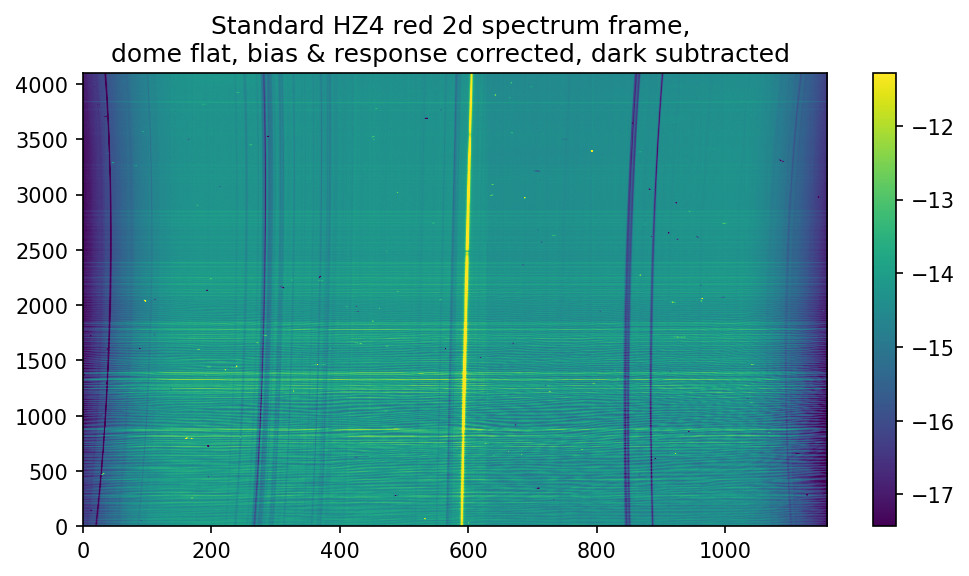

In [123]:
fig, ax = plt.subplots(1,1, figsize=(8, 4), facecolor='w', dpi=150)
data=std_red_2d[1]
vmin,vmax = zscale.get_limits(data)
im = ax.imshow(data, vmin=vmin,vmax=vmax,
               origin='lower', aspect='auto', )#cmap=plt.cm.inferno, )#vmin=0.9, vmax=1.1)
ax.set_title('Standard HZ4 red 2d spectrum frame, \ndome flat, bias & response corrected, dark subtracted ')
plt.colorbar(mappable=im, ax=ax)


In [129]:
from kosmos.imtools import darkcombine

ImportError: cannot import name 'darkcombine' from 'kosmos.imtools' (/Users/chris/GradResearch/kosmos/kosmos/imtools.py)

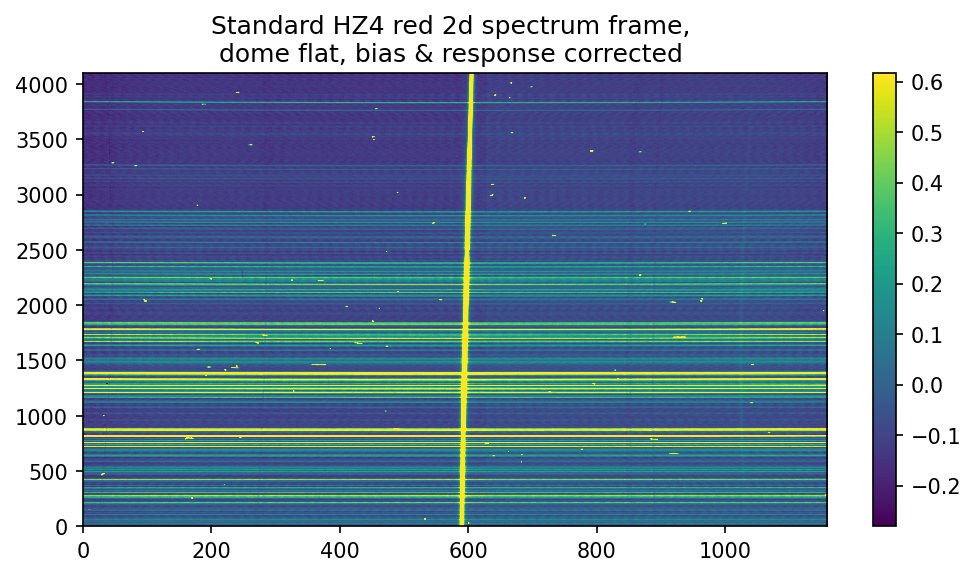

In [125]:
fig, ax = plt.subplots(1,1, figsize=(8, 4),facecolor='w', dpi=150)
data=std_red_2d[1]
vmin,vmax = zscale.get_limits(data)
im = ax.imshow(data, vmin=vmin,vmax=vmax,
               origin='lower', aspect='auto', )#cmap=plt.cm.inferno, )#vmin=0.9, vmax=1.1)
ax.set_title('Standard HZ4 red 2d spectrum frame, \ndome flat, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


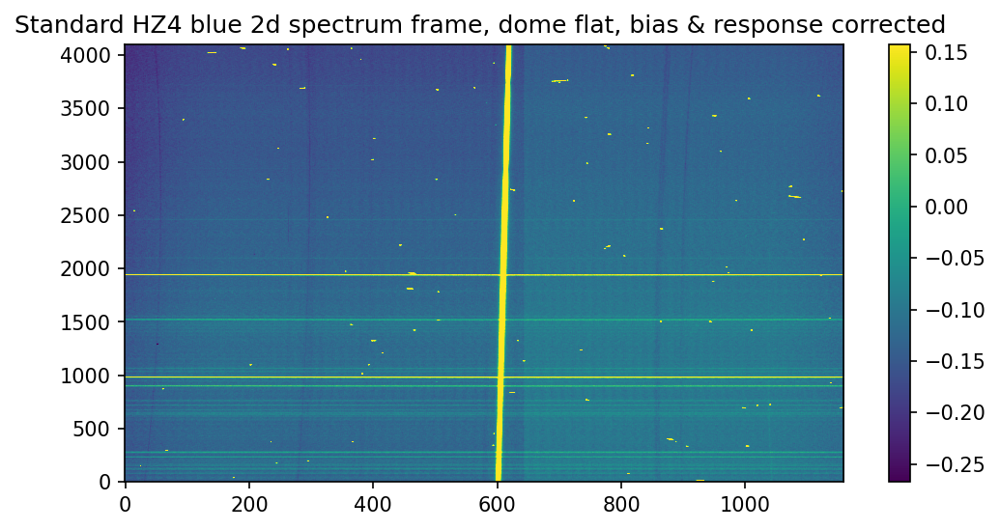

In [132]:
fig, ax = plt.subplots(1,1, figsize=(8, 4), facecolor='w', dpi=150)
data=std_blue_2d[1]
vmin,vmax = zscale.get_limits(data)
im = ax.imshow(data, vmin=vmin,vmax=vmax,
               origin='lower', aspect='auto', )#cmap=plt.cm.inferno, )#vmin=0.9, vmax=1.1)
ax.set_title('Standard HZ4 blue 2d spectrum frame, dome flat, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


# 2D reduction: qso005513red

Only red portion of the spectrum was taken, two frames: one 1800 sec, the other 1450 sec...

In [83]:
fnames =  [file for file in files if file.startswith('qso005513red')]
qso_red = [os.path.join(path,fname) for fname in fnames]


['/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/qso005513red.0058.fits',
 '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/qso005513red.0057.fits']

In [133]:
qso_red_2d = {}
for i in range(len(qso_red)):
    qso_red_2d[i] = kosmos.proc(qso_red[i], bias=bias, 
                                ilum=ilum_red_ext, flat=flat_red_ext, trim=True,
                                 Saxis=1 )#dark = darks[1800],)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


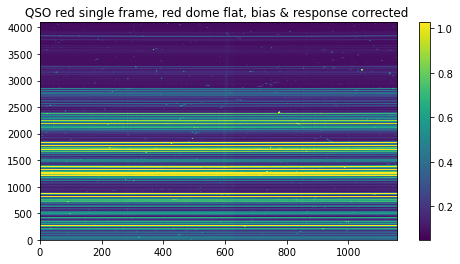

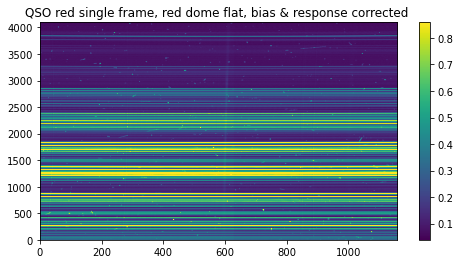

In [134]:
for i in range(len(qso_red_2d)):
    fig, ax = plt.subplots(1,1, figsize=(8, 4))
    data = qso_red_2d[i]
    vmin,vmax = zscale.get_limits(data)
    im = ax.imshow(data, vmin=vmin,vmax=vmax,origin='lower', aspect='auto', )#cmap=plt.cm.inferno)#,vmin=0.9, vmax=1.1)
    ax.set_title('QSO red single frame, red dome flat, bias & response corrected ')
    plt.colorbar(mappable=im, ax=ax)


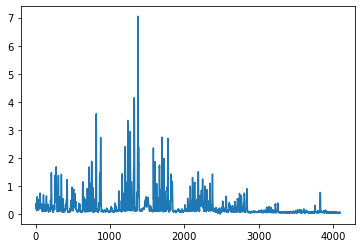

In [135]:
plt.plot(qso_red_2d[1].data[:,570])

how is it that after the supposed correction there are all these lines? Am I missing something? 

# 2D reduction:  wavelength cal 

that night only internal wavelength cals were obtained... 

In [94]:
# KryptonRed
# NeonRed

# KryptonBlue
# NeonBlue
# ArgonBlue 

fnames =  [file for file in files if file.startswith('NeonRed')]
red_neon_fpaths = [os.path.join(path,fname) for fname in fnames]

# 0059 had incorrect exposure time ... 
fnames =  [file for file in files if file.startswith('KryptonRedInternal.0060')]
red_kr_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('NeonBlue')]
blue_neon_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('ArgonBlue')]
blue_argon_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('KryptonBlue')]
blue_krypton_fpaths = [os.path.join(path,fname) for fname in fnames]

b

'/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/'

In [74]:
len(red_neon_fpaths)

2

Pick just the first red neon spectrum: 

In [95]:
red_neon_2d = kosmos.proc(red_neon_fpaths[0], bias=bias, ilum=ilum_red_int,
                          flat=flat_red_int, trim=True, #dark = darks[120],
                          Saxis=1, CR=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [96]:
red_kr_2d = kosmos.proc(red_kr_fpaths[0], bias=bias, ilum=ilum_red_int,
                          flat=flat_red_int, trim=True,#dark = darks[120], 
                          Saxis=1, CR=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


red_neon_2d
red_kr_2d
blue_neon_2d
blue_argon_2d
blue_krypton_2d

Pick only the first one as it had the right exp time... 

In [99]:
blue_neon_2d  = kosmos.proc(blue_neon_fpaths[0], bias=bias, ilum=ilum_blue_int,
                          flat=flat_blue_int, trim=True, #dark = darks[120], 
                          Saxis=1, CR=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Pick just the first blue Argon (both frames look identical)

In [100]:
blue_argon_2d  = kosmos.proc(blue_argon_fpaths[0], bias=bias, ilum=ilum_blue_int,
                          flat=flat_blue_int, trim=True, # dark = darks[120], 
                          Saxis=1, CR=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [136]:
blue_krypton_2d  = kosmos.proc(blue_krypton_fpaths[0], bias=bias, ilum=ilum_blue_int,
                          flat=flat_blue_int, trim=True, # dark = darks[120], 
                          Saxis=1, CR=False)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


# Trace the standard star HZ4 

Two frames for blue part of the spectrum of HZ4: 

In [263]:
kosmos.trace?

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


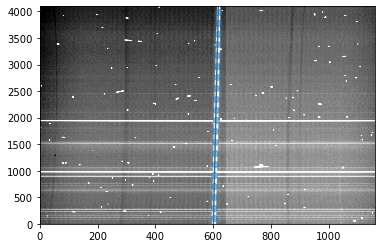

In [137]:
fig, ax = plt.subplots(1,1)
std_blue_trace = kosmos.trace(std_blue_2d[0], display=True, ax=ax, Saxis=1)

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


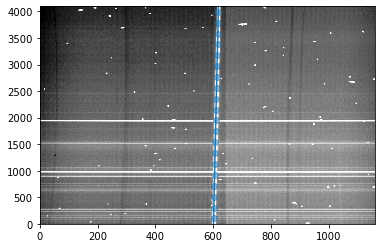

In [138]:
fig, ax = plt.subplots(1,1)
std_blue_trace = kosmos.trace(std_blue_2d[1], display=True, ax=ax, Saxis=1)

The second one looks cleaner - keep that! 

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


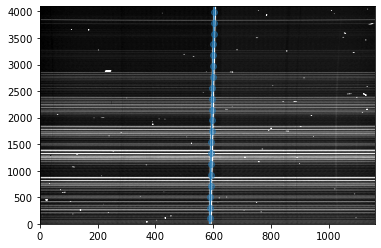

In [139]:
fig, ax = plt.subplots(1,1)
std_red_trace = kosmos.trace(std_red_2d[0], display=True, ax=ax, Saxis=1)

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


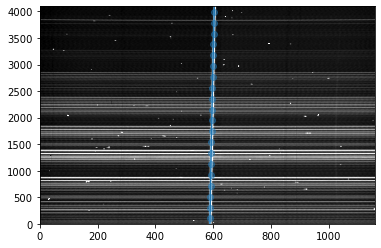

In [140]:
fig, ax = plt.subplots(1,1)
std_red_trace = kosmos.trace(std_red_2d[1], display=True, ax=ax, Saxis=1)

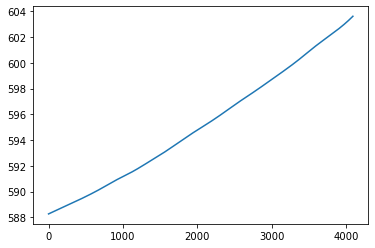

In [141]:
%matplotlib inline
plt.plot(std_red_trace)

How about QSO - the spectrum is definitely there, it's just faint ... 

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/chris/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


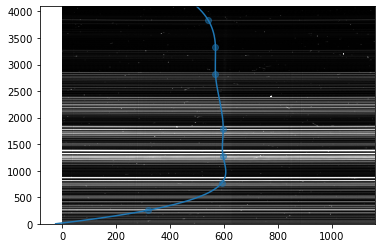

In [142]:
fig, ax = plt.subplots(1,1)
qso_red_trace = kosmos.trace(qso_red_2d[0], display=True, ax=ax, Saxis=1,
                            nbins=8, guess=570, window=30)

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


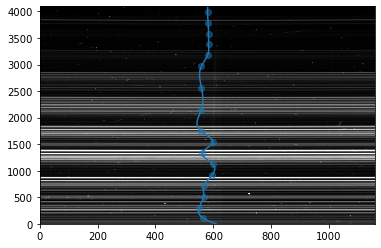

In [143]:
fig, ax = plt.subplots(1,1)
qso_red_trace = kosmos.trace(qso_red_2d[1], display=True, ax=ax, Saxis=1,guess=570, window=30)

[  Interactive trace from https://github.com/jradavenport/pykosmos/blob/main/notebooks/interactive_trace_example.ipynb  didn't work well for me, so just use the trace for the standard star - that seems to work best ] 

## Extract the QSO:

I use the trace for the standard, and since QSO was taken with red grism, I use the red trace. But first I  make my own plotting to make sure that the trace is actually centered on the QSO.. 

0.04867200228369857 1.0271001796647667


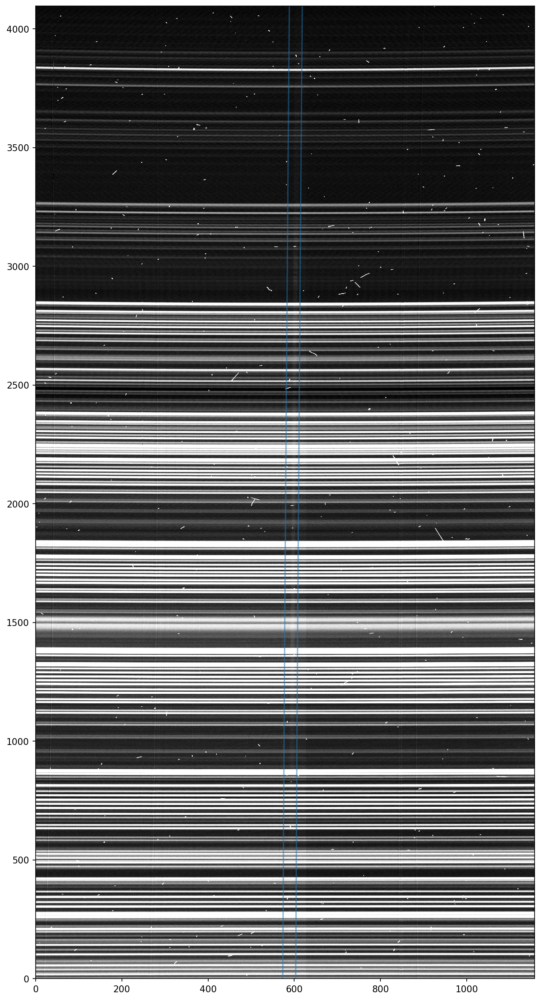

In [227]:
def plot_image_trace(img, trace_line, apwidth=15):
    fig,ax = plt.subplots(1,1, figsize=(10,20), dpi=150)
    zscale = ZScaleInterval()
    #data = img
    vmin, vmax=  zscale.get_limits(img)
    print(vmin,vmax)
    im = ax.imshow(img, vmin=vmin, vmax=0.7, origin='lower', aspect='auto', cmap=plt.cm.Greys_r)
    #im.set_clim(np.percentile(img, (5, 98)))
    #ax.plot(trace_line, np.arange(len(trace_line)), c='C0')
    ax.plot(trace_line + apwidth, np.arange(len(trace_line)), c='C0', alpha=0.5)
    ax.plot(trace_line - apwidth, np.arange(len(trace_line)), c='C0', alpha=0.5)
    
    
plot_image_trace(qso_red_2d[0], std_red_trace)

0.0389220348039217 0.8589129510691657


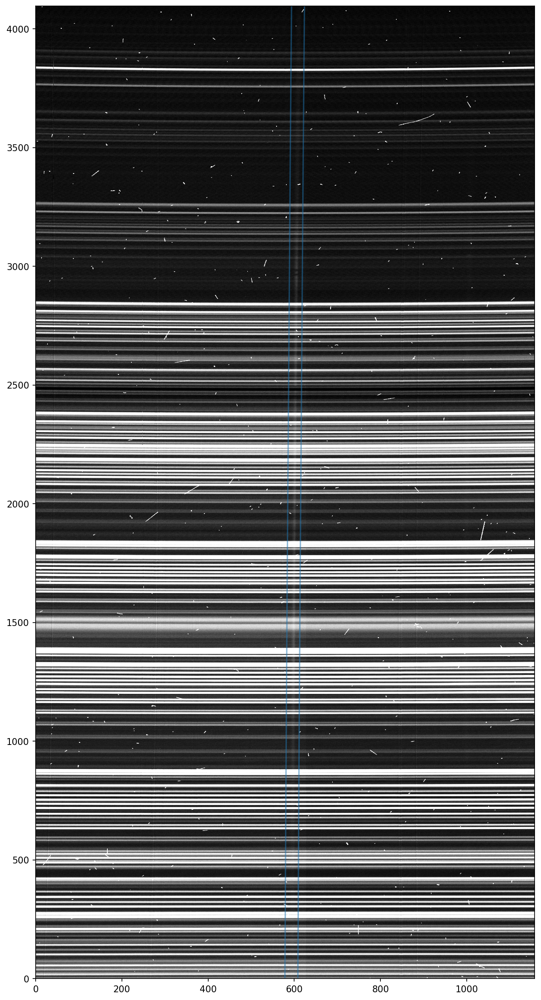

In [161]:
plot_image_trace(qso_red_2d[1], std_red_trace+5)

original trace line was not exactly centered on the QSO - but by tweaking vmax I see that now it is centered on the QSO spectrum. 

In [439]:
#spec1d-sky

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


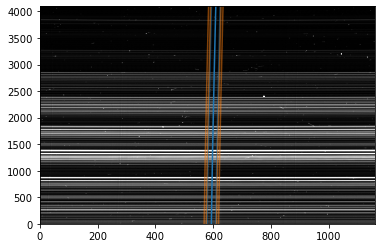

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


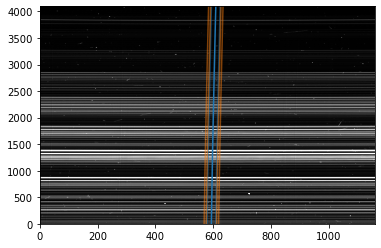

In [652]:

qso_red_1d = {}
qso_red_sky = {}
for i in range(len(qso_red_2d)):
    fig, ax = plt.subplots(1,1)
    spec, sky = kosmos.BoxcarExtract(qso_red_2d[i], std_red_trace+5, 
                                       display=True, ax=ax, Saxis=1,
                                       apwidth=15)
    qso_red_1d[i] = spec
    qso_red_sky[i] = sky 

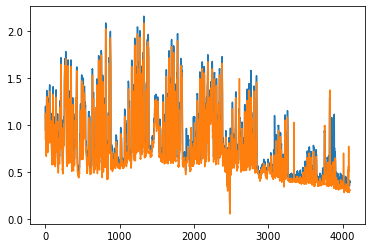

In [653]:
plt.plot(qso_red_1d[0].spectral_axis, np.log10(qso_red_1d[0].flux.data))
plt.plot(qso_red_1d[1].spectral_axis, np.log10(qso_red_1d[1].flux.data))

In [660]:
qso_red_1d[0].flux

<Quantity [ 8.82459959, 15.78942776, 14.06641554, ...,  2.43310546,
            2.44731047,  2.56289614] adu / s>

In [659]:
qso_red_sky[0].flux

<Quantity [ 8.76826129, 15.64345571, 13.2884371 , ...,  2.17168172,
            2.21386949,  2.16218182] adu / s>

In [663]:
np.log(np.array(qso_red_1d[0].flux-qso_red_sky[0].flux))

/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_41944/601401422.py:1: RuntimeWarning: invalid value encountered in log
  np.log(np.array(qso_red_1d[0].flux-qso_red_sky[0].flux))


array([-2.87638082, -1.92434008, -0.25105646, ..., -1.34161266,
       -1.45482603, -0.91450653])

/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_41944/3607118917.py:1: RuntimeWarning: invalid value encountered in log10
  plt.plot(qso_red_1d[0].spectral_axis, np.log10(np.array(qso_red_1d[0].flux-qso_red_sky[0].flux)))


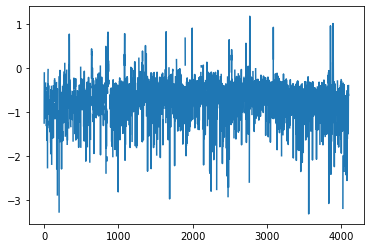

In [664]:
plt.plot(qso_red_1d[0].spectral_axis, 
         np.log10(np.array(qso_red_1d[0].flux-qso_red_sky[0].flux)))

I think there is continuum, it's just that the sky spectrum is very strong with such long exposure - keep going to create a sky-subtracted spectrum! 

The two are similar - at which stage do we average? 

# Extract standard star HZ4

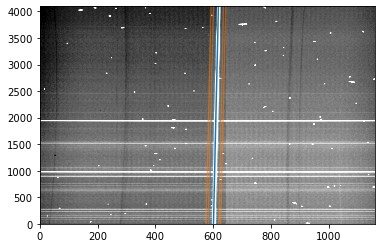

In [162]:
fig, ax = plt.subplots(1,1)
std_blue_1d, std_blue_sky = kosmos.BoxcarExtract(std_blue_2d[1], std_blue_trace, 
                                                   display=True, ax=ax, 
                                                  Saxis=1,
                                                 apwidth=15)

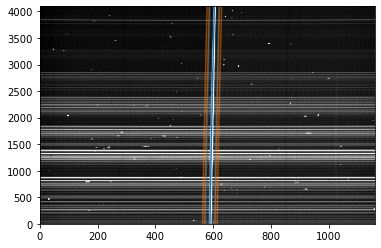

In [163]:
fig, ax = plt.subplots(1,1)
std_red_1d, std_red_sky = kosmos.BoxcarExtract(std_red_2d[1], std_red_trace, 
                                                   display=True, ax=ax, 
                                                  Saxis=1,
                                                 apwidth=15)

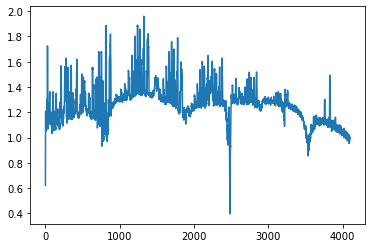

In [711]:
plt.plot(std_red_1d.spectral_axis, np.log10(std_red_1d.flux.data))

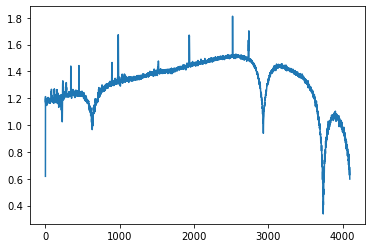

In [164]:
plt.plot(std_blue_1d.spectral_axis, np.log10(std_blue_1d.flux.data))

# Extract internal wavelength calibration frames

  Only if  a lamp standard file with  [wavelength,  flux]  does not exist ...
  
  red_neon_2d
    red_kr_2d
    blue_neon_2d
    blue_argon_2d
    blue_krypton_2d

In [127]:
red_kr_2d

CCDData([[-65.99008646, -42.0807807 , -37.45840694, ..., -26.21628935,
          -25.13201864, -39.69377435],
         [-31.80850258, -18.86074853, -30.51352048, ..., -31.18512427,
          -26.3003626 , -33.41082404],
         [-42.54600629, -40.43031864, -37.38523246, ...,  -5.00109546,
          -31.89439289, -32.16529093],
         ...,
         [-50.84625483, -60.86278386, -58.7452867 , ..., -10.54816338,
           -0.95196908, -21.00608117],
         [-31.46711289, -43.67868423, -40.81077037, ..., -27.92859248,
          -15.34554611,  -8.66873761],
         [-43.02863719, -14.36373118, -26.62151205, ...,  -4.77897687,
          -40.16693892, -17.76297888]], unit='adu / s')

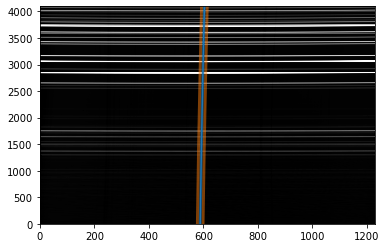

In [165]:
fig, ax = plt.subplots(1,1)
red_neon_1d, red_neon_sky = kosmos.BoxcarExtract(red_neon_2d, std_red_trace, display=True, 
                                                      ax=ax, 
                                                  Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)# **kwargs)



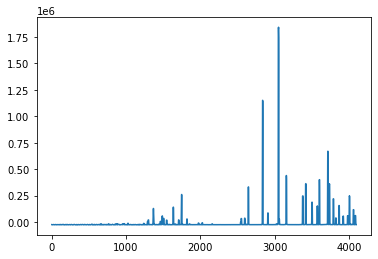

In [159]:
plt.plot(red_neon_1d.spectral_axis, red_neon_1d.flux)

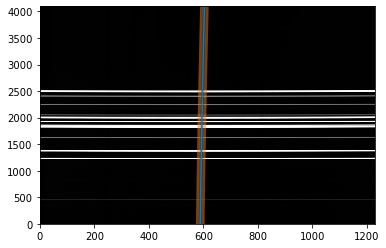

In [166]:
fig, ax = plt.subplots(1,1)
red_kr_1d, red_kr_sky = kosmos.BoxcarExtract(red_kr_2d, std_red_trace, display=True, 
                                                      ax=ax, 
                                                  Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)# **kwargs)



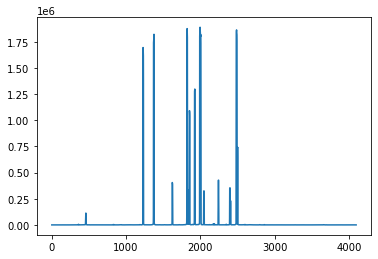

In [131]:
plt.plot(red_kr_1d.spectral_axis, red_kr_1d.flux)

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


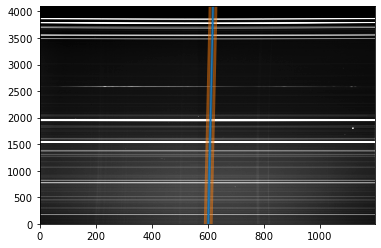

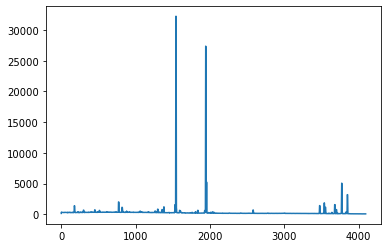

In [167]:
blue_kr_1d, blue_kr_sky = kosmos.BoxcarExtract(blue_krypton_2d, std_blue_trace, display=True, 
                                                    
                                                  Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)# **kwargs)
plt.plot(blue_kr_1d.spectral_axis, blue_kr_1d.flux)

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


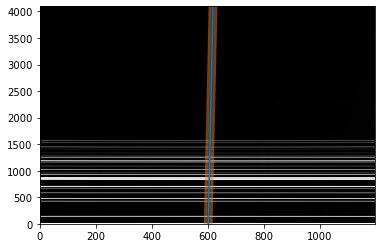

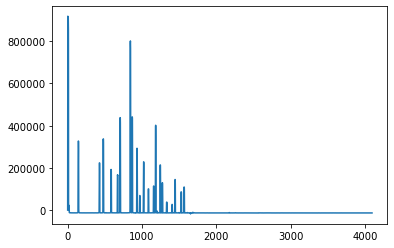

In [168]:
blue_neon_1d, blue_neon_sky = kosmos.BoxcarExtract(blue_neon_2d, std_blue_trace, display=True, 
                                                  Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)# **kwargs)
plt.plot(blue_neon_1d.spectral_axis, blue_neon_1d.flux)



/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


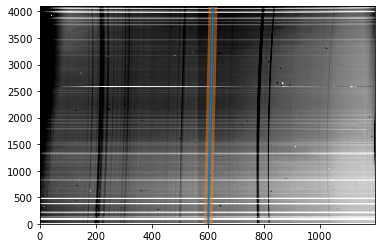

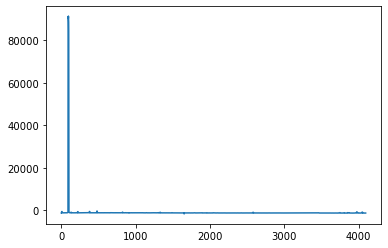

In [169]:
blue_argon_1d, blue_argon_sky = kosmos.BoxcarExtract(blue_argon_2d, std_blue_trace, display=True, 
                                                  Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)# **kwargs)
plt.plot(blue_argon_1d.spectral_axis, blue_argon_1d.flux)

# Standard wavelength calibration with internal cals

**[ASIDE]** - DOES NOT WORK ! This uses the header information as first guess (in Jim's example, `sciimg` is the result of `kosmos.proc`):

In [180]:
qso_red_2d[0].shape [1]

1158

In [302]:
linelist = 'apohenear.dat'
arclines = kosmos.loadlinelist(linelist)
sciarc_ex  = blue_neon_1d
sci_xpts, sci_wpts = kosmos.identify_nearest(sciarc_ex, wapprox=None,
                                            linewave=arclines, autotol=25)

0 lines matched from 0 within estimated range.


In [313]:
img = std_red_2d[i]

In [318]:
What are these two supposed to be ? 
I don't know where any DIS data could be .. 
#DISPDW = 4500
#DISPWC = 2 


In [317]:
(np.arange(img.shape[1]) - img.shape[1] / 2)[::-1] * DISPDW + DISPWC

array([ 2601002.,  2596502.,  2592002., ..., -2596498., -2600998.,
       -2605498.])

In [ ]:
np.arange(img.shape[1]) - img.

In [ ]:
# this data comes from the APO DIS red channel, which has wavelength axis backwards
# (despite not mentioning in the header...)
wapprox = (np.arange(sciimg.shape[1]) - sciimg.shape[1]/2)[::-1] * sciimg.header['DISPDW'] + sciimg.header['DISPWC']
wapprox = wapprox * u.angstrom

if DISPLAY:
    plt.errorbar(wapprox.value, sci_ex.flux.value - sci_sky.flux.value, 
                 yerr=sci_ex.uncertainty.array, linestyle='none')
    plt.xlabel(wapprox.unit)
    plt.ylabel(sci_ex.flux.unit)
    plt.title('Boxcar extract - sky')

In [ ]:
path_to_kosmos = '/'.join(kosmos.__file__.split('/')[:-1])
os.listdir(path_to_kosmos)

path_to_file = os.path.join(path_to_kosmos, 'resources/linelists/apohenear.dat')
print(path_to_file)

# The old IRAF-style linelists just have 2 col: (wavelength, line name)
# Helium, Neon, Argon 
henear_tbl = Table.read(path_to_file, 
                        names=('wave', 'name'), format='ascii')
# IMPROVEMENT NEEDED: need to make `identify_nearest` point to these linelists itself?
henear_tbl['wave'].unit = u.angstrom
apo_henear = henear_tbl['wave']


# use the "nearest" mode, which uses a list of known line features, and the
# approx wavelength from the header info. Starts in the middle, tries to find nearest
# peaks to those in the catalog... it works ok-ish for some modes

sci_xpts, sci_wpts = kosmos.identify_nearest(red_neon_1d, 
                                             wapprox=wapprox, linewave=apo_henear, autotol=5)b

**[END OF ASIDE]**

**Try the wavelet function: create the arc lamp reference file**

In [448]:
# path_to_kosmos = '/'.join(kosmos.__file__.split('/')[:-1])
# path_to_lines = os.path.join(path_to_kosmos,'resources/linelists/')
# os.listdir(path_to_lines)

# Need red neon, blue neon. So try 'apohenear'.... 
# df_spec2 = pd.read_csv(os.path.join(path_to_lines, 'apohenear.dat'))
# That's something else - it's only line list, not an actual calibrated spectrum...  

What AB shared was an actual spectrum, although I don't know in what units ...  Seems 100s of adus... But it sounds like it doesn't really matter since it's not flux - calibrated... 

In [178]:
df_spec = pd.read_csv('/Users/chris/Downloads/red_center_Neon_gp.spec')

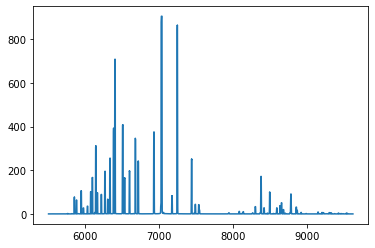

In [180]:
plt.plot(df_spec['wave'], df_spec['flux'])

In [333]:
#df_spec[df_spec.flux > 100]

This is the code that she got from Jim to use the wavelet analysis...


    df_spec1 = pd.read_csv('/Users/james/Dropbox/research_projects/kosmos-testing/UT211008/red_center_Neon_gp.spec')

    red_cent = Spectrum1D(spectral_axis=df_spec1['wave'].values * u.angstrom,
                          flux=df_spec1['flux'].values/100 * u.adu)

    xrc, wrc = kosmos.identify_dtw(sciarc, red_cent, upsample=False, 
                                open_begin=True, open_end=True, step_pattern='asymmetric',
                                display=False, peak_spline=True, pthreshold=0.9)

    sci_fit, _ = kosmos.fit_wavelength(sci_spectrum, xrc, wrc, mode='gp', display=False, 
                                            returnvar=True, GPRscale=101)

    xrc, wrc = kosmos.identify_dtw(calarc, red_cent, upsample=False, 
                                open_begin=True, open_end=True, step_pattern='asymmetric',
                                display=False, peak_spline=True, pthreshold=0.9)

    cal_fit, _ = kosmos.fit_wavelength(cal_spectrum, xrc, wrc, mode='gp', display=False, 
                                            returnvar=True, GPRscale=101)

**Manual widget - does work**

Use neon for red portion of the spectrum, and also neon for blue portion of the spectrum... 


    Instructions:
    ------------
    0) For proper interactive widgets, ensure you're using the Notebook backend
    in the Jupyter notebook, e.g.:
        %matplotlib notebook
    1) Click on arc-line features (peaks) in the plot. The Pixel Value box should update.
    2) Enter the known wavelength of the feature in the Wavelength box.
    3) Click the Assign button, a red line will be drawn marking the feature.
    4) When you've identified all your lines, stop the interaction for (or close) the figure.


<IPython.core.display.Javascript object>


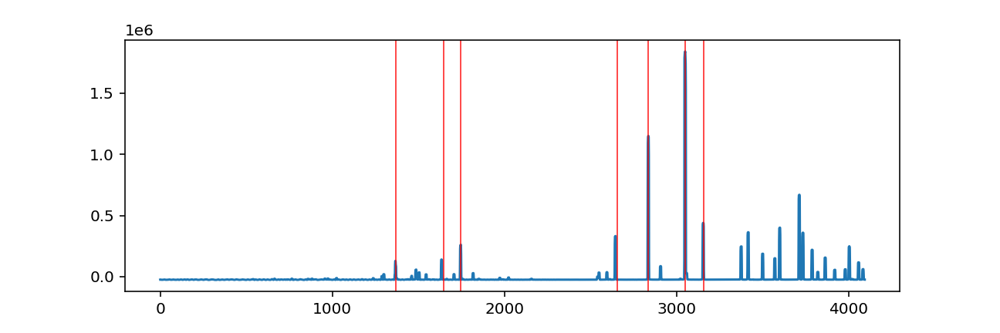

[1367.7196738786536] [8780.62]
[1367.7196738786536, 1645.2270571082413] [8780.62, 8495.36]
[1367.7196738786536, 1645.2270571082413, 1745.8000341286943] [8780.62, 8495.36, 8377.6]
[1367.7196738786536, 1645.2270571082413, 1745.8000341286943, 2656.984821689269] [8780.62, 8495.36, 8377.6, 7438.9]
[1367.7196738786536, 1645.2270571082413, 1745.8000341286943, 2656.984821689269, 2836.949099906953] [8780.62, 8495.36, 8377.6, 7438.9, 7245.17]
[1367.7196738786536, 1645.2270571082413, 1745.8000341286943, 2656.984821689269, 2836.949099906953, 3052.436284426194] [8780.62, 8495.36, 8377.6, 7438.9, 7245.17, 7032.0]
[1367.7196738786536, 1645.2270571082413, 1745.8000341286943, 2656.984821689269, 2836.949099906953, 3052.436284426194, 3158.4620630232625] [8780.62, 8495.36, 8377.6, 7438.9, 7245.17, 7032.0, 6929.47]


In [186]:
%matplotlib notebook
xpxl_int_arc_red, wpts_int_arc_red = kosmos.identify_widget(red_neon_1d)

In [201]:
wpts_int_arc_red = np.array(wpts_int_arc_red)*u.angstrom
xpxl_int_arc_red = np.array(xpxl_int_arc_red)

fname =  os.path.join(path, 'red_neon_xpx_wpts.txt')
X = [np.array(wpts_int_arc_red), xpxl_int_arc_red]
np.savetxt(fname, X)

In [203]:
# this can be loaded later with 
#wpts, xpx = np.loadtxt(fname)

fname =  os.path.join(path, 'red_neon_xpx_wpts.txt')
wpts, xpx = np.loadtxt(fname)

In [225]:
kosmos.identify_widget??


    Instructions:
    ------------
    0) For proper interactive widgets, ensure you're using the Notebook backend
    in the Jupyter notebook, e.g.:
        %matplotlib notebook
    1) Click on arc-line features (peaks) in the plot. The Pixel Value box should update.
    2) Enter the known wavelength of the feature in the Wavelength box.
    3) Click the Assign button, a red line will be drawn marking the feature.
    4) When you've identified all your lines, stop the interaction for (or close) the figure.


<IPython.core.display.Javascript object>


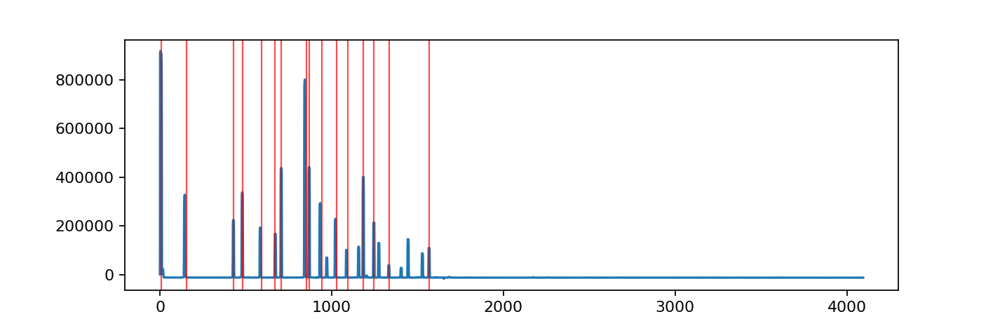

[6.066341243797389] [7032.0]
[6.066341243797389, 152.92302301677404] [7032.0, 6929.47]
[6.066341243797389, 152.92302301677404, 427.4190738890712] [7032.0, 6929.47, 6717.0]
[6.066341243797389, 152.92302301677404, 427.4190738890712, 480.27176173242214] [7032.0, 6929.47, 6717.0, 6678.0]
[6.066341243797389, 152.92302301677404, 427.4190738890712, 480.27176173242214, 592.9094493339409] [7032.0, 6929.47, 6717.0, 6678.0, 6599.0]
[6.066341243797389, 152.92302301677404, 427.4190738890712, 480.27176173242214, 592.9094493339409, 671.3260839540758] [7032.0, 6929.47, 6717.0, 6678.0, 6599.0, 6533.0]
[6.066341243797389, 152.92302301677404, 427.4190738890712, 480.27176173242214, 592.9094493339409, 671.3260839540758, 706.0553334939569] [7032.0, 6929.47, 6717.0, 6678.0, 6599.0, 6533.0, 6506.0]
[6.066341243797389, 152.92302301677404, 427.4190738890712, 480.27176173242214, 592.9094493339409, 671.3260839540758, 706.0553334939569, 851.8585063331227] [7032.0, 6929.47, 6717.0, 6678.0, 6599.0, 6533.0, 6506.0, 6

In [577]:
%matplotlib notebook
xpxl_int_arc_blue, wpts_int_arc_blue = kosmos.identify_widget(blue_neon_1d)

In [319]:
blue_neon_1d

<Spectrum1D(flux=<Quantity [  1042.07975026, 908257.70459138, 917321.79349991, ...,
           -12399.09726151, -12394.25706371, -12328.20067003] adu / s>, spectral_axis=<SpectralAxis [0.000e+00, 1.000e+00, 2.000e+00, ..., 4.093e+03, 4.094e+03, 4.095e+03] pix>, uncertainty=StdDevUncertainty([ 529.15342207, 2827.67011057, 5522.55828061, ...,
                     53.00160468,   53.98126071,   83.166604  ]))>

In [578]:
wpts_int_arc_blue = np.array(wpts_int_arc_blue)*u.angstrom
xpxl_int_arc_blue = np.array(xpxl_int_arc_blue)

In [579]:
fname =  os.path.join(path, 'blue_neon_xpx_wpts.txt')
X = [np.array(wpts_int_arc_blue), xpxl_int_arc_blue]
np.savetxt(fname, X)

Use these solutions for the actual Neon lamp spectrum

In [549]:
fname =  os.path.join(path, 'blue_neon_xpx_wpts.txt')
xpx, wpts = np.loadtxt(fname)

In [554]:
import specutils
# signature of calibrate_wavelengths is (xpts, wpts, obj_spectrum, sky_spectrum...)

def apply_wavelength_solution(obj_spectrum, xpts=None, wpts=None, 
                              sky_spectrum=None,  
                              fit_wavelength_args={'mode':'interp',
                              'deg':1}):
    
    ''' This is needed to apply a wavelength solution (xpts, wpts) mapping,
    i.e. what wavelength  each x-pixel position along the spectral axis 
    corresponds to. These points are used to fit a simple eg. linear
    function that maps x-position to wavelength. 
    
    obj_spectrum: specutils.spectra.spectrum1d.Spectrum1D, 
        a 1D spectrum (i.e. after extraction of the spectrum 
        along  a trace from an original FITS image, which 
        is a 2D spectrum). 
        If the  obj_spectrum corresponds to a sky observation, 
        it will contain sky lines contamination (eg. science object,
        standard star). In that case, sky_spectrum should also be 
        provided to create a sky-subtracted spectrum.
        However, uf obj_spectrum corresponds to a calibration,
        eg. external or internal calibration arc lamps, 
        then there is no need to subtract sky background emission
        (since there isn't any). 
    xpts:  numpy.ndarray  of x-positions along spectral axis 
    wpts:  numpy.ndarray of wavelength (in Angstroms) along spectral axis 
    sky_spectrum: specutils.spectra.spectrum1d.Spectrum1D (optional)
       a 1D spectrum (as above), usually from running 
       obj_spectrum, sky_spectrum = kosmos.BoxcarExtract(obj_2D_spectrum, 
                                       obj_trace, **kwargs)
    mode: str, mode used by kosmos.fit_wavelength() ('interp' or 'gp') 
    deg : int,  degree of polynomial (default is 1) options 
         passed to   kosmos.fit_wavelength()             
    
    '''
    # xpts = xpxl_int_arc_red
    # wpts = wpts_int_arc_red
    # obj_spectrum = red_neon_1d
    # sky_spectrum = red_neon_sky

    #Create sky subtracted spectrum
    if sky_spectrum is not None:
        obj_flux = obj_spectrum.flux-sky_spectrum.flux
    else:
        obj_flux = obj_spectrum.flux
    sky_sub_obj_spectrum = specutils.Spectrum1D(flux=obj_flux, 
                                                spectral_axis=obj_spectrum.spectral_axis, 
                                    uncertainty=obj_spectrum.uncertainty)

    #Apply the wavelength solution to the sky subtracted spectrum
    obj_wave = kosmos.fit_wavelength(sky_sub_obj_spectrum, 
                                            xpts, wpts, **fit_wavelength_args)
    #mode='interp', deg=deg)
    return obj_wave


Fit wavelength to the red Neon 1D spectrum to store as a reference spectrum (flux calibration doesn't matter for that, can be left as adu/s).

In [564]:
wpts_int_arc_red

<Quantity [8780.62, 8495.36, 8377.6 , 7438.9 , 7245.17, 7032.  , 6929.47] Angstrom>

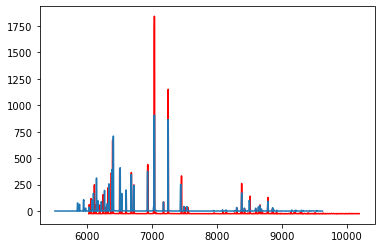

In [575]:
#red_neon_1D_wave = apply_wavelength_solution(red_neon_1d,  
#                                             xpxl_int_arc_red, wpts_int_arc_red,
#                                            )

fit_wavelength_args={'mode':'interp', 'deg':1}
red_neon_1D_wave = kosmos.fit_wavelength(red_neon_1d, 
                                         xpxl_int_arc_red, wpts_int_arc_red, 
                                         **fit_wavelength_args
                                        )
# store the wavelength-calibrated arc lamp spectrum 
t = Table(data=[np.array(red_neon_1D_wave.wavelength), np.array(red_neon_1D_wave.flux)],
          names=['wave','flux'])
t.write('red_high_neon_1d_wave.txt', 
         format='ascii', overwrite=True)

# plot what it looks like 
plt.plot(red_neon_1D_wave.spectral_axis, red_neon_1D_wave.flux/1e3, c='red')
plt.plot(df_spec['wave'], df_spec['flux'])

Do the same for the blue portion of the spectrum:

In [558]:
kosmos.fit_wavelength

array([7032.41, 6929.47, 6717.  , 6678.  , 6599.  , 6533.  , 6506.  ,
       6402.  , 6383.  , 6334.  , 6143.  , 6096.  ])

In [581]:
#fname =  os.path.join(path, 'blue_neon_xpx_wpts.txt')
#xpts, wpts = np.loadtxt(fname)
#wpts *= u.angstrom
#blue_neon_1D_wave = apply_wavelength_solution(blue_neon_1d, xpts, wpts*u.angstrom,)

xpts = xpxl_int_arc_blue
wpts = wpts_int_arc_blue
blue_neon_1D_wave  = kosmos.fit_wavelength(blue_neon_1d, 
                                         xpts, wpts, 
                                         **fit_wavelength_args
                                        )

(5500.0, 9000.0)

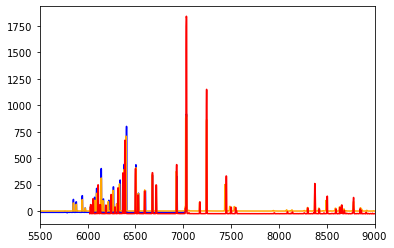

In [588]:
%matplotlib inline
# store the wavelength-calibrated arc lamp spectrum 
t = Table(data=[np.array(blue_neon_1D_wave.wavelength), np.array(blue_neon_1D_wave.flux)],
          names=['wave','flux'])
t.write('blue_high_neon_1d_wave.txt', 
         format='ascii', overwrite=True)

# plot what it looks like 
plt.plot( blue_neon_1D_wave.spectral_axis, blue_neon_1D_wave.flux/1e3, c='blue')
plt.plot(df_spec['wave'], df_spec['flux'], c='orange')
plt.plot(red_neon_1D_wave.spectral_axis, red_neon_1D_wave.flux/1e3, c='red')
plt.xlim(5500,9000)

All peaks are in the same places, which should be the case. Blue high -  the fitted spectral range for the blue portion of the spectrum - overlaps orange (the red center example from AB), as well as red high (fitted before). This should not be divergent , since the lamp should have very consistent spectrum . So this is a sanity check. 

In [591]:
# to use a previously stored one, do 
from specutils import Spectrum1D
red_high = Table.read('red_high_neon_1d_wave.txt', format='ascii',)
red_high_1d = Spectrum1D(spectral_axis=red_high['wave'].data * u.angstrom,
                      flux=red_high['flux'].data * u.adu)



Text(0.5, 1.0, 'Wavelength Calibrated Spectrum Red Neon Low')

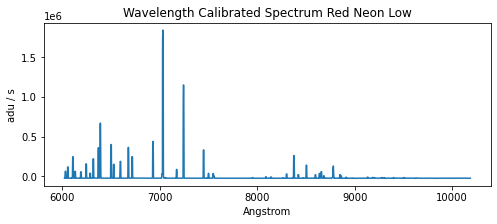

In [592]:
#obj_spectrum_wavelength_calibrated.write(os.path.join(output_directory, output_filename), format='tabular-fits', overwrite=True)
fig,ax = plt.subplots(1,1, figsize=(8,3))
ax.plot(red_neon_1D_wave.spectral_axis, 
        red_neon_1D_wave.flux)
#ax.set_ylim(10,)
ax.set_xlabel(red_neon_1D_wave.spectral_axis.unit)
ax.set_ylabel(red_neon_1D_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum Red Neon Low')

There's no airmass correction since it's an internal lamp.... I wonder if I can use that as a template to find wavelength solution:

In [533]:
red_low = red_neon_1D_wave # seems that Jim's script asks for a regular 1D spectrum in angstroms and adus... 
sciarc = red_neon_1d
xrl, wrl = kosmos.identify_dtw(sciarc, red_low, upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=False, peak_spline=True, pthreshold=0.9)



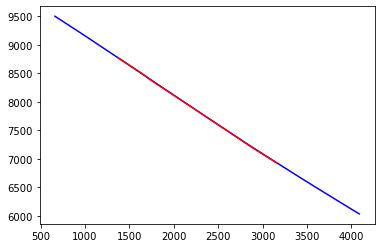

In [534]:
plt.plot(xrl, wrl, c='blue') # this is the result of fitting the arc lamp 1D spectrum to a saved pattern
fname =  os.path.join(path, 'red_neon_xpx_wpts.txt')
wpts, xpx = np.loadtxt(fname)
plt.plot(xpx, wpts , c='red')# this is the result of running identification by hand 


they're identical! That's great - that means that  I can repeatedly use that to run the reduction, just need to prepare all lamps that I'd use ... 

In [362]:
!pip install george 

     |████████████████████████████████| 330 kB 3.5 MB/s eta 0:00:01


In [536]:
sci_fit,_ = apply_wavelength_solution(std_red_1d,  
                                    xrl, wrl,
                                    std_red_sky,  
                                    fit_wavelength_args = {'mode':'gp', 
                                    'display':False, 
                                    'returnvar':True, 
                                    'GPRscale':101}
                                    )


# sci_spectrum = std_red_1d - std_red_sky
# sci_fit, _ = kosmos.fit_wavelength(sci_spectrum, xrl, wrl, mode='gp', display=False, 
#                                         returnvar=True, GPRscale=101)

Text(0.5, 1.0, 'Wavelength Calibrated Spectrum HZ4')

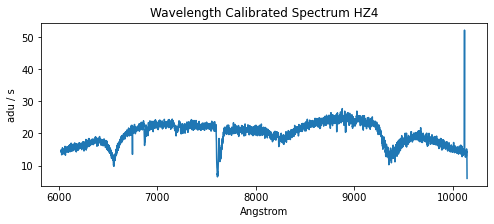

In [537]:
fig,ax = plt.subplots(1,1, figsize=(8,3))
ax.plot(sci_fit.spectral_axis, 
        sci_fit.flux)
ax.set_xlabel(std_red_1D_wave.spectral_axis.unit)
ax.set_ylabel(std_red_1D_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum HZ4')

Basically I could modify the `script_reduce` wrapper to use that for wavelength solution. 

In [ ]:
df_spec1 = pd.read_csv('/Users/james/Dropbox/research_projects/kosmos-testing/UT211008/red_center_Neon_gp.spec')

red_cent = Spectrum1D(spectral_axis=df_spec1['wave'].values * u.angstrom,
                      flux=df_spec1['flux'].values/100 * u.adu)

xrc, wrc = kosmos.identify_dtw(sciarc, red_cent, upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=False, peak_spline=True, pthreshold=0.9)

sci_fit, _ = kosmos.fit_wavelength(sci_spectrum, xrc, wrc, mode='gp', display=False, 
                                        returnvar=True, GPRscale=101)

xrc, wrc = kosmos.identify_dtw(calarc, red_cent, upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=False, peak_spline=True, pthreshold=0.9)

cal_fit, _ = kosmos.fit_wavelength(cal_spectrum, xrc, wrc, mode='gp', display=False, 
                                        returnvar=True, GPRscale=101)

## Apply wavelength solution to standard star HZ4 spectrum

Now, either via hand-identification, or using previously stored file, we have an arc lamp wavelength reference file ... So that we can use this method 

    xrc, wrc = kosmos.identify_dtw(sciarc, red_cent, upsample=False, 
                                open_begin=True, open_end=True, step_pattern='asymmetric',
                                display=False, peak_spline=True, pthreshold=0.9)

    sci_fit, _ = kosmos.fit_wavelength(sci_spectrum, xrc, wrc, mode='gp', display=False, 
                                        returnvar=True, GPRscale=101)

In [593]:
# use the spectral reference created in the previous step 
from specutils import Spectrum1D
red_ref = Table.read('red_high_neon_1d_wave.txt', format='ascii',)
red_ref_1d = Spectrum1D(spectral_axis=red_ref['wave'].data * u.angstrom,
                        flux=red_ref['flux'].data * u.adu)


blue_ref = Table.read('blue_high_neon_1d_wave.txt', format='ascii',)
blue_ref_1d = Spectrum1D(spectral_axis=blue_ref['wave'].data * u.angstrom,
                        flux=blue_ref['flux'].data * u.adu)


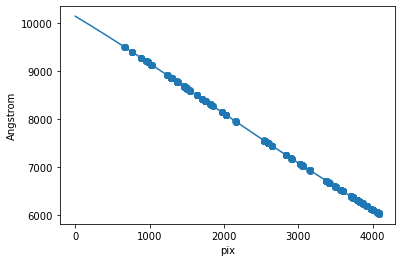

In [594]:
# find wavelength solution given the arc lamp spectrum and the 
# wavelength reference file 
# red_neon_1d : 1D spectrum extracted using the standard star trace 
xrh, wrh = kosmos.identify_dtw(red_neon_1d, red_ref_1d,  upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=True, peak_spline=True, pthreshold=0.9)


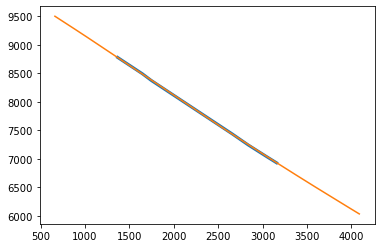

In [631]:
plt.plot(xpxl_int_arc_red , wpts_int_arc_red, lw=3)
plt.plot(xrh, wrh)


it's exactly the same mapping! 

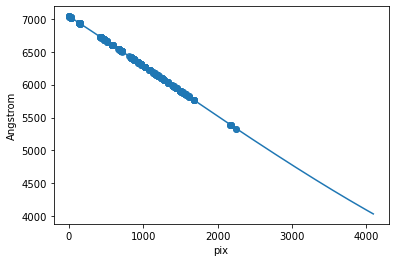

In [595]:
xbh, wbh = kosmos.identify_dtw(blue_neon_1d, blue_ref_1d,  upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=True, peak_spline=True, pthreshold=0.9)


In [596]:
#std_red_1d : 1D spectrum extracted for the standard star ... 
std_red_1d_wave,_ = apply_wavelength_solution(std_red_1d,  
                                    xrh, wrh,
                                    std_red_sky,  
#                                     fit_wavelength_args = {'mode':'interp',
#                                                            'deg':1}
                                    fit_wavelength_args = {'mode':'gp', 
                                    'display':False, 
                                    'returnvar':True, 
                                    'GPRscale':100}
                                    )

In [599]:
#std_red_1d : 1D spectrum extracted for the standard star ... 
std_blue_1d_wave,_ = apply_wavelength_solution(std_blue_1d,  
                                    xbh, wbh,
                                    std_blue_sky,  
#                                     fit_wavelength_args = {'mode':'interp',
#                                                            'deg':1}
                                    fit_wavelength_args = {'mode':'gp', 
                                    'display':False, 
                                    'returnvar':True, 
                                    'GPRscale':100}
                                    )

with the correct wavelength solution (which should look like the above), we get a 
pretty nice result, regardless of what's used by `kosmos.fit_wavelength` function ... 

Text(0.5, 1.0, 'Wavelength Calibrated Spectrum HZ4')

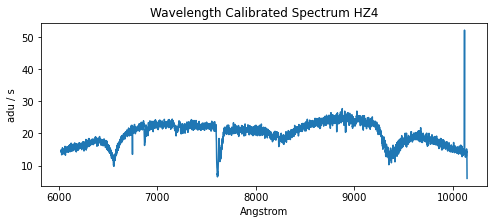

In [545]:
fig,ax = plt.subplots(1,1, figsize=(8,3))
ax.plot(std_red_1d_wave.spectral_axis, 
        std_red_1d_wave.flux)
ax.set_xlabel(std_red_1d_wave.spectral_axis.unit)
ax.set_ylabel(std_red_1d_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum HZ4')

Text(0.5, 1.0, 'Wavelength Calibrated Spectrum HZ4')

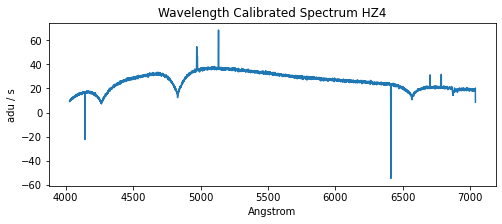

In [600]:
fig,ax = plt.subplots(1,1, figsize=(8,3))
ax.plot(std_blue_1d_wave.spectral_axis, 
        std_blue_1d_wave.flux)
ax.set_xlabel(std_blue_1d_wave.spectral_axis.unit)
ax.set_ylabel(std_blue_1d_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum HZ4')

## Apply wavelength solution for the quasar red spectrum:

We're using the same `xrh, wrh` (x-points red high,   wavelength red high)  and `xbh, wbh` (x-points blue high, wave blue high, )

In [608]:
len(xrh)

410

In [609]:
len(wrh)

410

In [624]:
qso_red_1d[i]

<Spectrum1D(flux=<Quantity [ 7.12469386, 13.24400867, 11.71738461, ...,  2.04098043,
            2.02970111,  2.02881967] adu / s>, spectral_axis=<SpectralAxis [0.000e+00, 1.000e+00, 2.000e+00, ..., 4.093e+03, 4.094e+03, 4.095e+03] pix>, uncertainty=StdDevUncertainty([       nan,        nan, 0.3455438 , ..., 0.46551023,
                          nan, 0.31458301]))>

In [647]:
qso_red_1d_wave = {}
# there are two red exposures for this spectrum ... 
for i in range(len(qso_red_1d)):
    #qso_red_1d_wave[i] = apply_wavelength_solution(qso_red_1d[i], 
    #                            xrh, wrh, 
                               # xpxl_int_arc_red , wpts_int_arc_red,
    #                            qso_red_sky[i],
    #                            fit_wavelength_args = {'mode':'interp', 'deg':1}
     #                                               )
#                                     fit_wavelength_args = {'mode':'gp', 
#                                     'display':False, 
#                                     'returnvar':True, 
#                                     'GPRscale':100})

    obj_flux = qso_red_1d[i].flux - qso_red_sky[i].flux
    sky_sub_obj_spectrum = specutils.Spectrum1D(flux=obj_flux, 
                                                spectral_axis=obj_spectrum.spectral_axis, 
                                    uncertainty=obj_spectrum.uncertainty)
    qso_1d_wave = kosmos.fit_wavelength(sky_sub_obj_spectrum, 
                                               xpxl_int_arc_red , wpts_int_arc_red,
                                       # xrh, wrh, 
                                               mode='interp', deg=3)
    qso_red_1d_wave[i] = qso_1d_wave


/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_41944/3529544364.py:1: RuntimeWarning: invalid value encountered in log10
  plt.plot(qso_1d_wave.spectral_axis, np.log10(qso_1d_wave.flux.data))


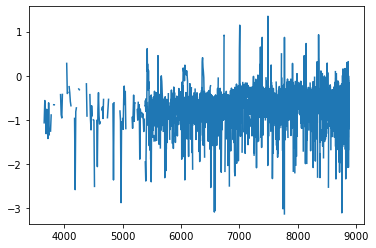

In [666]:
plt.plot(qso_1d_wave.spectral_axis, np.log10(qso_1d_wave.flux.data))

/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_41944/3558764082.py:4: RuntimeWarning: invalid value encountered in log10
  ax.plot(qso_red_1d_wave[i].spectral_axis, np.log10(qso_red_1d_wave[i].flux.data))
/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_41944/3558764082.py:4: RuntimeWarning: invalid value encountered in log10
  ax.plot(qso_red_1d_wave[i].spectral_axis, np.log10(qso_red_1d_wave[i].flux.data))


Text(0.5, 1.0, 'Wavelength Calibrated Spectrum QSO')

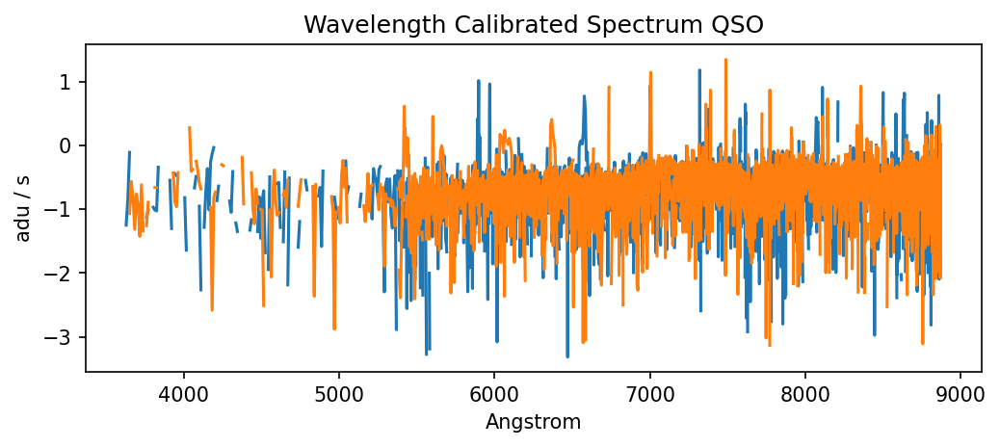

In [669]:
fig,ax = plt.subplots(1,1,figsize=(8,3), dpi=150)

for i in range(len(qso_red_1d)):
    ax.plot(qso_red_1d_wave[i].spectral_axis, np.log10(qso_red_1d_wave[i].flux.data))
ax.set_xlabel(qso_red_1d_wave[i].spectral_axis.unit)
ax.set_ylabel(qso_red_1d_wave[i].flux.unit)
ax.set_title('Wavelength Calibrated Spectrum QSO')
#ax.set_ylim(0.20)

In [286]:
#Apply the wavelength solution to the sky subtracted spectrum
qso_red_1D_wave = kosmos.fit_wavelength(sky_sub_obj_spectrum, 
                                        xpts, wpts, mode='interp', deg=3)
#obj_spectrum_wavelength_calibrated.write(os.path.join(output_directory, output_filename), format='tabular-fits', overwrite=True)
fig,ax = plt.subplots(1,1, figsize=(8,3))
ax.plot(qso_red_1D_wave.spectral_axis, 
        qso_red_1D_wave.flux)
ax.set_xlabel(std_red_1D_wave.spectral_axis.unit)
ax.set_ylabel(std_red_1D_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum QSO')

NameError: name 'spec' is not defined

# Airmass correction

In [676]:
ZD = qso_red_2d[0].header['ZD'] / 180.0 * np.pi
airmass = 1.0/np.cos(ZD) # approximate Zenith Distance -> Airmass conversion
# Select the observatory-specific airmass extinction profile from the provided "extinction" library
#Xfile = kosmos.obs_extinction(extinction_file)

In [698]:
std_red_1D_wave

<Spectrum1D(flux=<Quantity [ 5.98065827, 13.41600003, 14.41366611, ..., 14.78434063,
           14.05969695, 14.76585352] adu / s>, spectral_axis=<SpectralAxis [10186.54913107, 10185.52119446, 10184.49325785, ...,  6025.74473671,
    6024.77770773,  6023.81067876] Angstrom>, uncertainty=StdDevUncertainty([2.50066853, 3.71902887, 3.85441806, ..., 3.85299203,
                   3.76434188, 3.85832741]))>

In [703]:
Xfile = kosmos.obs_extinction('apoextinct.dat')

std_red_airmass_corr = kosmos.airmass_cor(std_red_1d_wave, 
                                          std_red_2d[0].header['AIRMASS'],
                                          Xfile)
qso_red_airmass_corr = {}
for i in range(2):
    qso_red_airmass_corr[i] = kosmos.airmass_cor(qso_red_1d_wave[i], 
                                           qso_red_2d[i].header['AIRMASS']
                                           , Xfile)

# Flux Calibration

I download the data for HZ4 from https://www.eso.org/sci/observing/tools/standards/spectra/hz4.html

In [690]:
std= Table.read('/Users/chris/GradResearch/kosmos/kosmos/resources/onedstds/okestan/mhz4.dat',
               format='ascii')

In [673]:
standardstar = kosmos.onedstd('okestan/mhz4.dat')

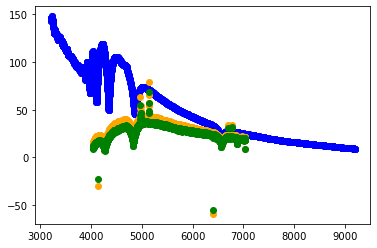

In [688]:
plt.scatter(standardstar['wave'], standardstar['flux']*1e16, c='blue')
plt.scatter(std_red_airmass_corr.wavelength, std_red_airmass_corr.flux, c='orange')
plt.scatter(std_red_1d_wave.wavelength, std_red_1d_wave.flux, c='green')

In [704]:
# this is the sensitivity function, which converts the CCD data from
# ADU/S -> erg/s/cm2/A
sens_func = kosmos.standard_sensfunc(std_red_airmass_corr, standardstar, mode='linear')

Text(0, 0.5, 'sensfunc')

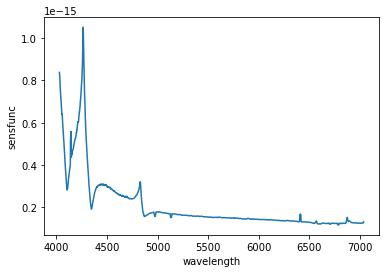

In [705]:
%matplotlib inline
plt.plot(sens_func.spectral_axis, sens_func.flux)
plt.xlabel('wavelength')
plt.ylabel('sensfunc')

why is it so rough?  Is there any step that wasn't done properly? 

Text(0.5, 1.0, 'Flux Calibrated Spectrum HZ4')

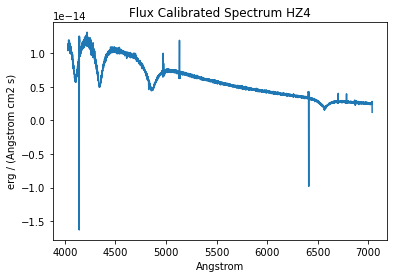

In [706]:
# flux_calibrate(obj_spectrum_wavelength_calibrated, sens_func,


std_red_1D_flux_calib = kosmos.apply_sensfunc(std_red_airmass_corr, 
                                            sens_func, )
#flux_calib_spectrum.write(os.path.join(output_directory, output_filename), format='tabular-fits', overwrite=True)
fig, ax = plt.subplots(1,1)
ax.plot(std_red_1D_flux_calib.spectral_axis.value, std_red_1D_flux_calib.flux.value)
ax.set_xlabel(std_red_1D_flux_calib.spectral_axis.unit)
ax.set_ylabel(std_red_1D_flux_calib.flux.unit)
ax.set_title('Flux Calibrated Spectrum HZ4')  

In [707]:
qso_red_1D_flux_calib = {}
for i in range(2):
    qso_red_1D_flux_calib[i] = kosmos.apply_sensfunc(qso_red_airmass_corr[i], 
                                            sens_func, )

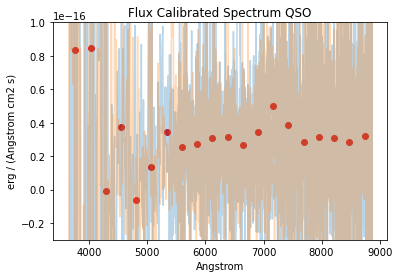

In [709]:
from scipy.stats import binned_statistic
fig, ax = plt.subplots(1,1)
for i in range(2):
    x = qso_red_1D_flux_calib[i].spectral_axis.value
    y = qso_red_1D_flux_calib[i].flux.value
    statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=20)
    bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
    ax.plot(x,y, alpha=0.3)


ax.set_xlabel(std_red_1D_flux_calib.spectral_axis.unit)
ax.set_ylabel(std_red_1D_flux_calib.flux.unit)
ax.set_title('Flux Calibrated Spectrum QSO')  
ax.set_ylim(-0.03e-15,0.1e-15)
ax.scatter(bin_centers, statistic, c='red')

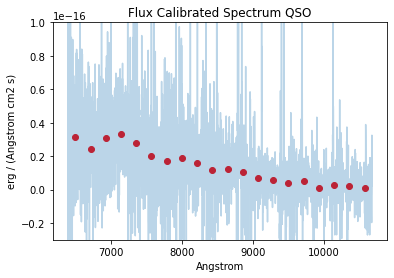

In [266]:
from scipy.stats import binned_statistic
fig, ax = plt.subplots(1,1)
x = qso_red_1D_flux_calib.spectral_axis.value
y = qso_red_1D_flux_calib.flux.value
statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=20)
bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
ax.plot(x,y, alpha=0.3)


ax.set_xlabel(std_red_1D_flux_calib.spectral_axis.unit)
ax.set_ylabel(std_red_1D_flux_calib.flux.unit)
ax.set_title('Flux Calibrated Spectrum QSO')  
ax.set_ylim(-0.03e-15,0.1e-15)
ax.scatter(bin_centers, statistic, c='red')

One thing I don't understand is  why on  a sky-subtracted spectrum there are still so many sky lines ?? 

that just seems so messy , and I don't even see where is the issue (????? )

# Try the kosmos.script_reduce

* it also uses the standard star trace for the science target... 
* it looks nice in theory - I wonder if it will work! 
* it doesn't - it needs an initial guess at the wavelength solution; it tries to do one based on the DIS keywords, which are absent in KOSMOS, hence it doesn't work ... 

Needs to have the following structure: 
    
    CSV that has two columns:
        `file path, type`

    where `type` must be from the list of available filetypes:
        `(bias, flat, arc, std, object)`

In [245]:
# make a scrit for red portion of the spectrum.... I think the script doesn't know 
# which part of the spectrum we're reducing .... 

fpath = []
ftype = []

fpath.append(biasfiles)
ftype.append(len(biasfiles)*['bias'])

fpath.append(flat_red_ext_fpaths)
ftype.append(len(flat_red_ext_fpaths)*['flat'])

fpath.append(red_neon_fpaths)
ftype.append(len(red_neon_fpaths)*['arc'])

fpath.append(std_red)
ftype.append(len(std_red)*['std:okestan/mhz4.dat'])

fpath.append(qso_red)
ftype.append(len(qso_red)*['object'])

In [256]:
X

[array(['/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0003.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0002.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0005.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0009.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0008.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0004.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0007.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0006.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/bias.0001.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/flatRedQrtzExt.0051.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/flatRedQrtzExt.0047.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/flatRedQrtzExt.0046.fits',
        '/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/flatRedQrtzE

In [282]:
X = [np.concatenate(fpath), np.concatenate(ftype)]
fname = os.path.join(path,'script_reduce_red.txt')
print(fname)

/Users/chris/GradResearch/Q1UW05/UT230114/kosmos/script_reduce_red.txt


In [262]:
Table(X).write(fname, format='csv', overwrite=True, )#header='')

In [278]:
import importlib as imp
imp.reload(kosmos)

<module 'kosmos' from '/Users/chris/GradResearch/kosmos/kosmos/__init__.py'>

In [275]:
kosmos.script_reduce??

In [283]:
kosmos.script_reduce(fname, display=True, debug=True,
                     waveapprox=True, trace_guess=600, trace_window=100, stdtrace=True,
                    Saxis=1)

TypeError: can only concatenate str (not "Table") to str

In [ ]:

# filke names 
flat_blue_ext_fpaths
std_blue
blue_neon_fpaths